In [2]:
import os
import json
import torch
from torch.utils.data import DataLoader
import torchvision
import torchvision.models as models
import numpy as np
import cv2
import utils
import trainer
import evaluator
import data_process
import motion_blur
import matplotlib.pyplot as plt

# Set random seed for reproducibility
seed = 211
np.random.seed(seed)
torch.manual_seed(seed)

In [3]:
data_process.download_data()

input_size = 448

transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((input_size, input_size)),
    torchvision.transforms.ToTensor(), # uint8 values in [0, 255] -> float tensor with values [0, 1]
    torchvision.transforms.Normalize(mean=data_process.train_mean.tolist(), std=data_process.train_std.tolist())
])

train_set, val_set, test_set = data_process.load_data(transform=transform, input_size=input_size)

# Save train, val, and test indices to JSON:
split_data = {
    "train": train_set.indices,
    "val": val_set.indices,
    "test": test_set.indices
}

with open('./data/chitholian_annotated_potholes_dataset/our_split.json', "w") as file:
    json.dump(split_data, file, indent=4)

test_set_uni_001 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.01})
test_set_uni_005 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.05})
test_set_uni_01 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.1})
test_set_elli_001 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.01})
test_set_elli_005 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.05})
test_set_elli_01 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.1})
test_set_nat = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'natural'})

Data already exists

Number of valid images: 664
Train set size: 464 - 69.88%
Validation set size: 67 - 10.09%
Test set size: 133 - 20.03%



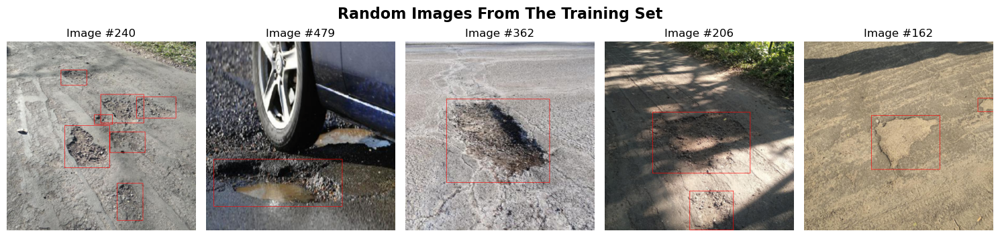

In [3]:
# Display 5 random images from the training set
train_loader = DataLoader(train_set, batch_size=5, shuffle=True, collate_fn=data_process.collate_fn)
images, targets = next(iter(train_loader))
data_process.show_images(images, targets, title="Random Images From The Training Set")

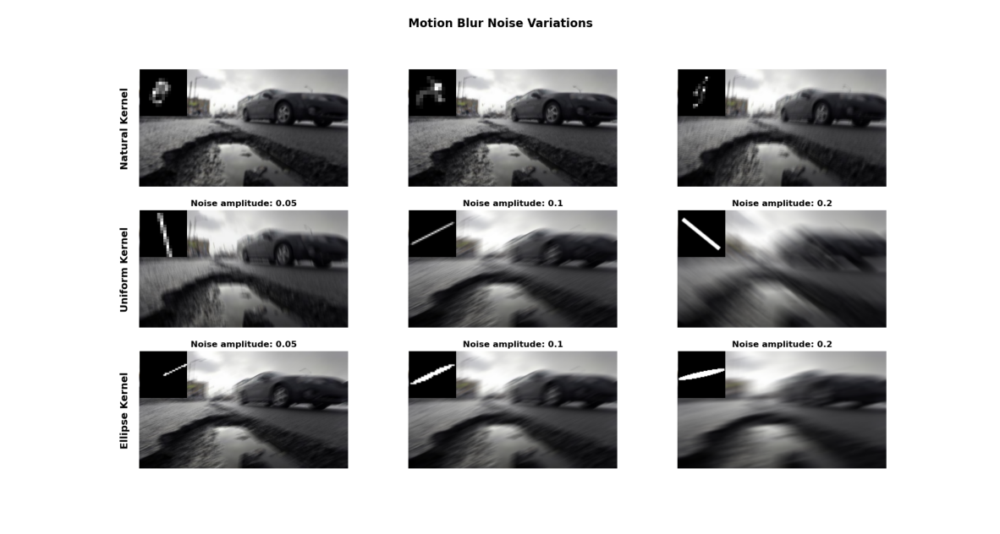

In [5]:
#show noise types
image = cv2.imread("plots/motion_blur_types.png")
# Convert BGR to RGB for matplotlib
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display using matplotlib
plt.figure(figsize=(15, 15))
plt.imshow(image_rgb)
plt.axis('off')  # Turn off axis
plt.title("", fontsize=16)
plt.show()

Mean Average Precision @ 0.5 : 0.7006 FPS: 46.14


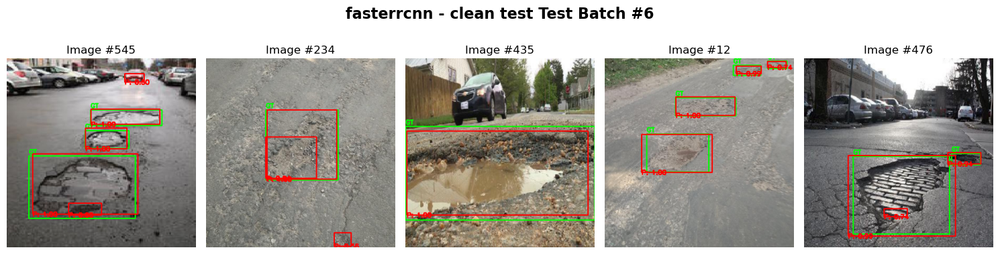

Mean Average Precision @ 0.5 : 0.5476 FPS: 49.90


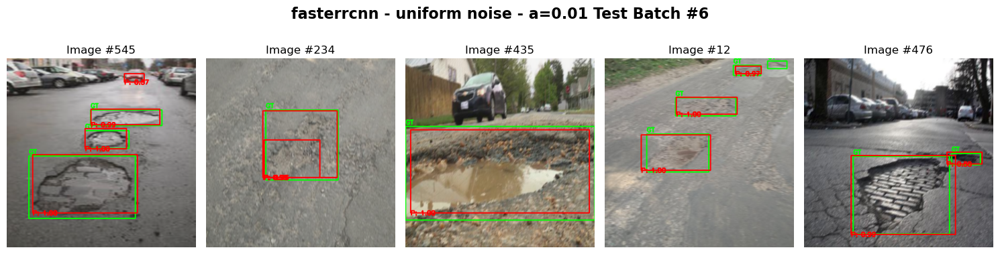

Mean Average Precision @ 0.5 : 0.2187 FPS: 49.88


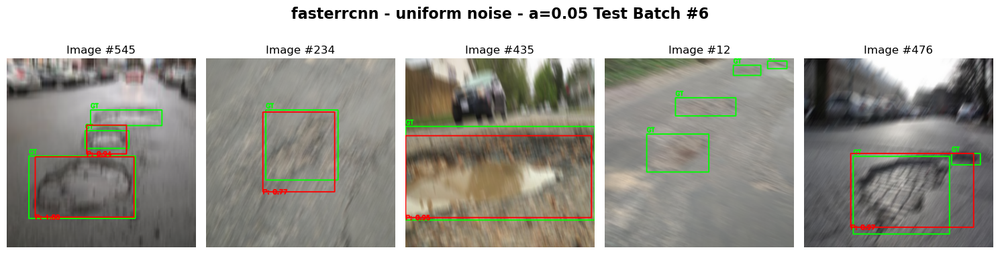

Mean Average Precision @ 0.5 : 0.0547 FPS: 50.25


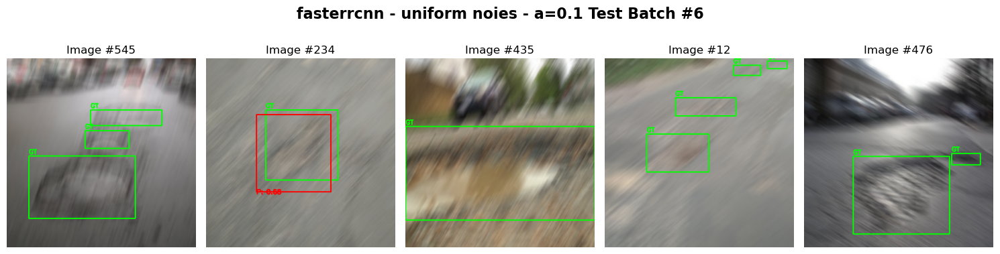

Mean Average Precision @ 0.5 : 0.5555 FPS: 49.78


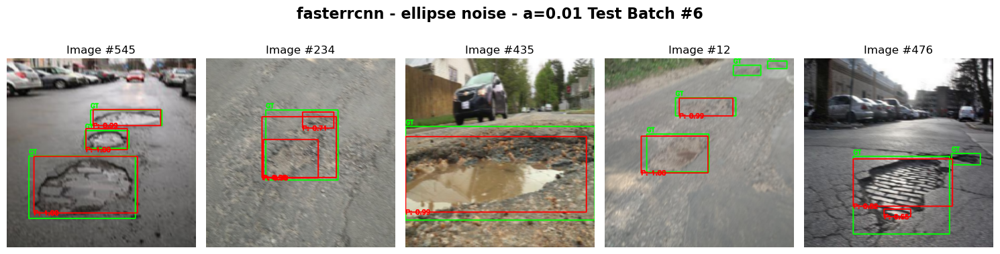

Mean Average Precision @ 0.5 : 0.1715 FPS: 49.93


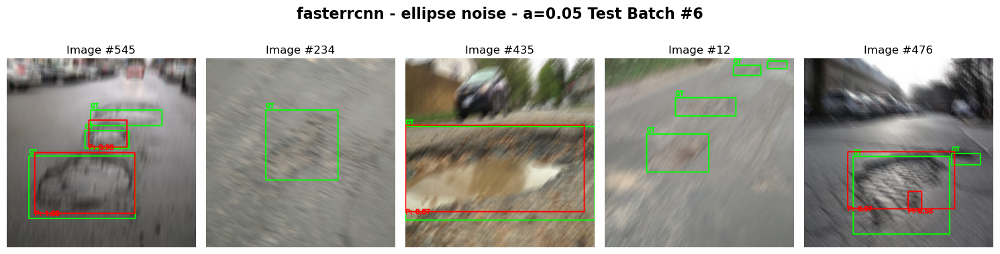

Mean Average Precision @ 0.5 : 0.0483 FPS: 49.94


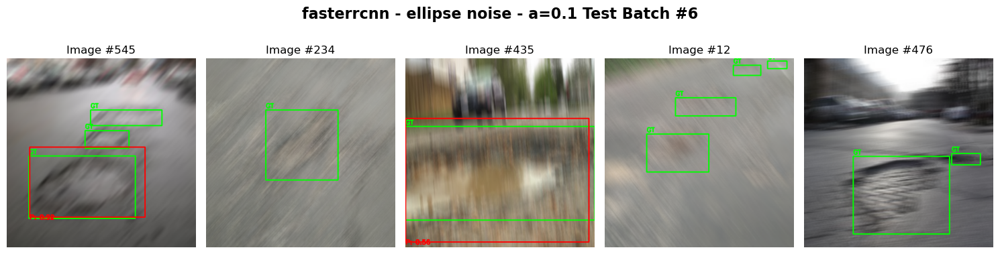

Mean Average Precision @ 0.5 : 0.4482 FPS: 49.68


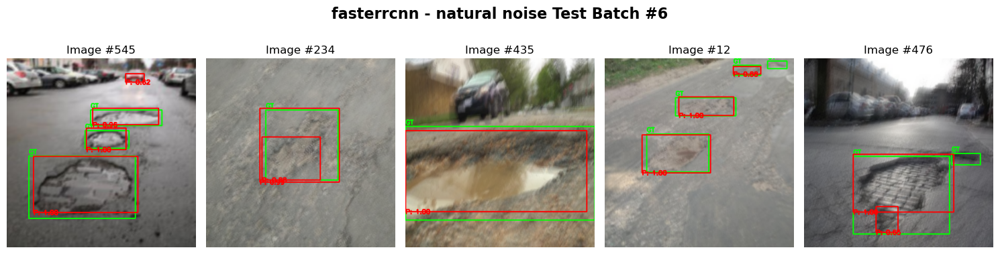

In [4]:
model_name = "fasterrcnn_resnet50_fpn"
model = trainer.get_model(model_name=model_name) 
state_dict = torch.load("data/models/fasterrcnn_resnet50_fpn/fasterrcnn_resnet50_fpn_best.pth", weights_only=True)
model.load_state_dict(state_dict)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the GPU
model.eval()  # Set the model to evaluation mode

# test the model
batch_index = 5
evaluator.test_model(model, test_set, index=batch_index, title="fasterrcnn - clean test")
evaluator.test_model(model, test_set_uni_001, index=batch_index, title="fasterrcnn - uniform noise - a=0.01")
evaluator.test_model(model, test_set_uni_005, index=batch_index, title="fasterrcnn - uniform noise - a=0.05")
evaluator.test_model(model, test_set_uni_01, index=batch_index, title="fasterrcnn - uniform noies - a=0.1")
evaluator.test_model(model, test_set_elli_001, index=batch_index, title="fasterrcnn - ellipse noise - a=0.01")
evaluator.test_model(model, test_set_elli_005, index=batch_index, title="fasterrcnn - ellipse noise - a=0.05")
evaluator.test_model(model, test_set_elli_01, index=batch_index, title="fasterrcnn - ellipse noise - a=0.1")
evaluator.test_model(model, test_set_nat, index=batch_index, title="fasterrcnn - natural noise")

In [3]:
# Train with data augmentation:
trainer.train_from_config(model_config_path="data/models/fasterrcnn_resnet50_fpn/fasterrcnn_resnet50_fpn_best_params.json", train_set=train_set, val_set=val_set, save_path="./", kornia_aug=True)

Starting training for fasterrcnn_resnet50_fpn with the following parameters:
{'batch_size': 7, 'epochs': 17, 'preweight_mode': 'fine_tuning', 'optimizer': 'SGD', 'lr': 0.005077286891014731, 'momentum': 0.9410626508845523, 'weight_decay': 6.509385638898574e-05, 'scheduler': 'CosineAnnealingLR', 'T_max': 6, 'eta_min': 3.181777359507687e-07}
Epoch 1/17, Train Loss: 34.0735, Val mAP@50: 0.4884, FPS: 52.34, Epoch Time: 24.26 seconds
Epoch 2/17, Train Loss: 22.8945, Val mAP@50: 0.6285, FPS: 51.42, Epoch Time: 24.09 seconds
Epoch 3/17, Train Loss: 19.0909, Val mAP@50: 0.7068, FPS: 51.71, Epoch Time: 24.29 seconds
Epoch 4/17, Train Loss: 17.4495, Val mAP@50: 0.7567, FPS: 51.59, Epoch Time: 24.40 seconds
Epoch 5/17, Train Loss: 15.4319, Val mAP@50: 0.7488, FPS: 51.62, Epoch Time: 24.32 seconds
Epoch 6/17, Train Loss: 14.4921, Val mAP@50: 0.7506, FPS: 51.37, Epoch Time: 24.35 seconds
Epoch 7/17, Train Loss: 14.4639, Val mAP@50: 0.7506, FPS: 52.62, Epoch Time: 24.31 seconds
Epoch 8/17, Train Loss

{'train_losses': [34.07348494231701,
  22.8945405036211,
  19.09086924791336,
  17.449533380568027,
  15.431898802518845,
  14.49211423099041,
  14.463879831135273,
  14.56697292625904,
  14.543032519519329,
  14.66752715408802,
  14.988531291484833,
  14.199987575411797,
  15.418702997267246,
  14.086805373430252,
  12.441946052014828,
  11.11765843629837,
  10.292641703039408],
 'val_maps': [0.4884442389011383,
  0.628517746925354,
  0.706795334815979,
  0.756747305393219,
  0.7488019466400146,
  0.7505618333816528,
  0.7505618333816528,
  0.7595779895782471,
  0.7457219958305359,
  0.6942680478096008,
  0.7428445219993591,
  0.739091694355011,
  0.7167993783950806,
  0.7345182299613953,
  0.7528548240661621,
  0.7704036235809326,
  0.74736487865448],
 'best_val_map': 0.7704036235809326,
 'fps': 53.06244883696936,
 'train_time': 403.65104842185974,
 'model_parameters': 41076761,
 'model_size': 157.94906997680664,
 'test_map': 0.0}

Mean Average Precision @ 0.5 : 0.6945 FPS: 50.17


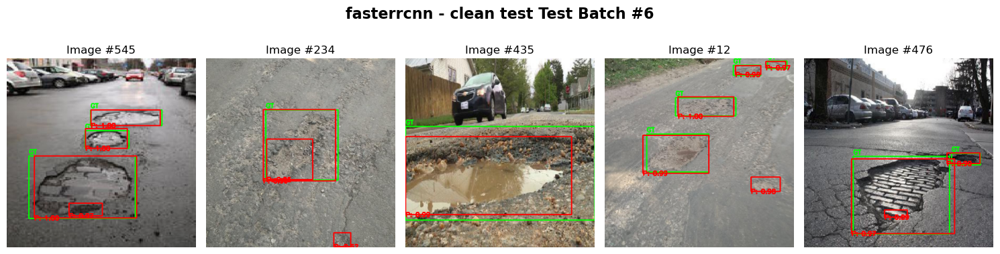

Mean Average Precision @ 0.5 : 0.6492 FPS: 50.13


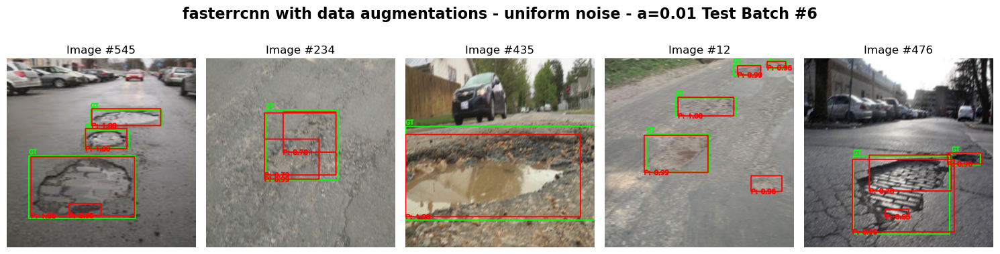

Mean Average Precision @ 0.5 : 0.5398 FPS: 49.98


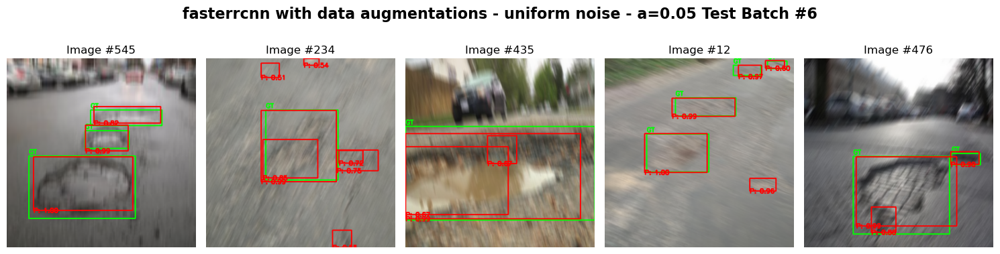

Mean Average Precision @ 0.5 : 0.3579 FPS: 49.96


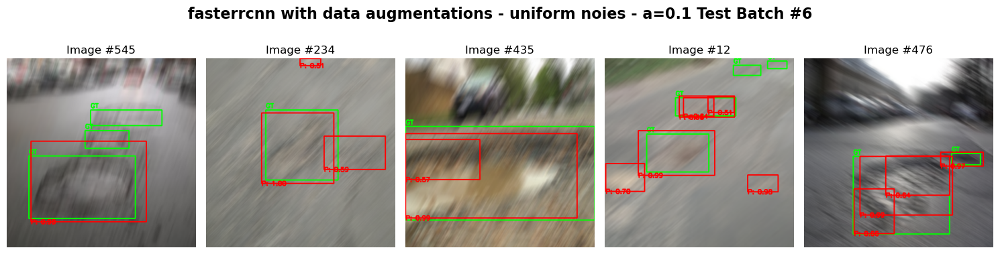

Mean Average Precision @ 0.5 : 0.6525 FPS: 50.04


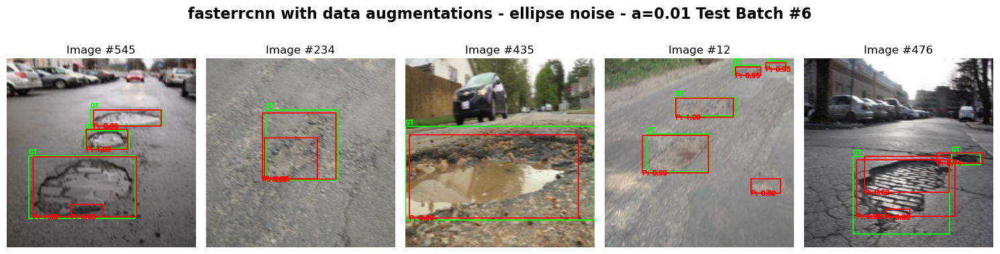

Mean Average Precision @ 0.5 : 0.4582 FPS: 50.02


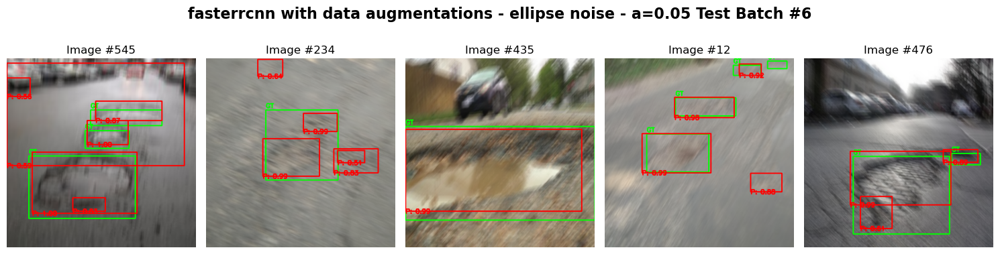

Mean Average Precision @ 0.5 : 0.3056 FPS: 50.05


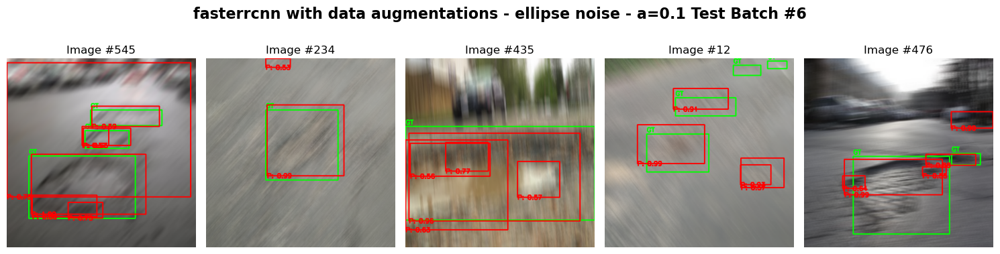

Mean Average Precision @ 0.5 : 0.5896 FPS: 49.38


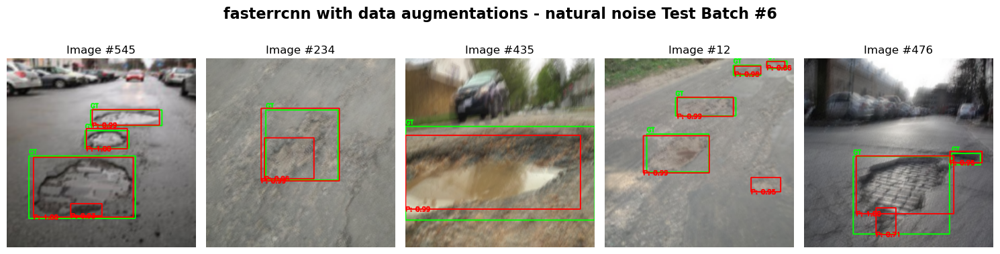

In [5]:
model_name = "fasterrcnn_resnet50_fpn"
model = trainer.get_model(model_name=model_name) 
state_dict = torch.load("data/models/fasterrcnn_resnet50_fpn/fasterrcnn_resnet50_fpn_aug_best.pth", weights_only=True)
model.load_state_dict(state_dict)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the GPU
model.eval()  # Set the model to evaluation mode

# test the model
batch_index = 5
evaluator.test_model(model, test_set, index=batch_index, title="fasterrcnn - clean test")
evaluator.test_model(model, test_set_uni_001, index=batch_index, title="fasterrcnn with data augmentations - uniform noise - a=0.01")
evaluator.test_model(model, test_set_uni_005, index=batch_index, title="fasterrcnn with data augmentations - uniform noise - a=0.05")
evaluator.test_model(model, test_set_uni_01, index=batch_index, title="fasterrcnn with data augmentations - uniform noies - a=0.1")
evaluator.test_model(model, test_set_elli_001, index=batch_index, title="fasterrcnn with data augmentations - ellipse noise - a=0.01")
evaluator.test_model(model, test_set_elli_005, index=batch_index, title="fasterrcnn with data augmentations - ellipse noise - a=0.05")
evaluator.test_model(model, test_set_elli_01, index=batch_index, title="fasterrcnn with data augmentations - ellipse noise - a=0.1")
evaluator.test_model(model, test_set_nat, index=batch_index, title="fasterrcnn with data augmentations - natural noise")